In [ ]:
!git clone https://github.com/esoyeon/Multilingual-StyleCLIP.git

Cloning into 'Multilingual-StyleCLIP'...
remote: Enumerating objects: 539, done.
remote: Counting objects: 100% (539/539), done.
remote: Compressing objects: 100% (428/428), done.
remote: Total 539 (delta 147), reused 471 (delta 89), pack-reused 0
Receiving objects: 100% (539/539), 80.72 MiB | 40.44 MiB/s, done.
Resolving deltas: 100% (147/147), done.


In [ ]:
# set up
%tensorflow_version 1.x
! pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html 

# clip install
!pip install git+https://github.com/openai/CLIP.git 

# multilingual set up 
!pip install ftfy regex tqdm gdown
!pip install transformers

# Ninja set up
!wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
!sudo unzip ninja-linux.zip -d /usr/local/bin/
!sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

TensorFlow 1.x selected.
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |███████████████████████         | 834.1 MB 1.3 MB/s eta 0:04:04tcmalloc: large alloc 1147494400 bytes == 0x55ef584a2000 @  0x7f44aba78615 0x55ef1f3ad4cc 0x55ef1f48d47a 0x55ef1f3b02ed 0x55ef1f4a1e1d 0x55ef1f423e99 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f423d00 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f420737 0x55ef1f4a2c66 0x55ef1f41fdaf 0x55ef1f4a2c66 0x55ef1f41fdaf 0x55ef1f4a2c66 0x55ef1f41fdaf 0x55ef1f3b2039 0x55ef1f3f5409 0x55ef1f3b0c52 0x55ef1f423c25 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f420737 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f41f915 0x55ef1f3b1afa 0x55ef1f41fc0d 0x55ef1f41e9ee
     |█████████████████████████████▏  | 1055.7 MB 1.2 MB/s eta 0:01:24tcmalloc: large alloc 1434370048 bytes == 0x55ef9caf8000 @  0x7f44aba78615 0x55ef1f3ad4cc 0x55ef1f48d47a 0x55ef1f3b02ed 0x55ef1f4a1e1d 0x55ef1f423e99 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f423d00 0x55ef1f41e9ee 0x55ef1f3b1bda 0x55ef1f420737 0x

In [ ]:
%cd /content/Multilingual-StyleCLIP

/content/Multilingual-StyleCLIP


# Restyle Encoder

## Set up

In [ ]:
# import libraries
from argparse import Namespace
import time
import sys
import pprint
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms

sys.path.append(".")
sys.path.append("..")

from models.RestyleEncoder.utils.common import tensor2im
from models.RestyleEncoder.psp import pSp

%load_ext autoreload
%autoreload 2

In [ ]:
# Get pretrained model url
import os
current_directory = os.getcwd()
save_path = os.path.join(current_directory, "pretrained_models")
if not os.path.exists(save_path):
    os.makedirs(save_path)

download_command = r"""wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id={FILE_ID}' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id={FILE_ID}" -O {SAVE_PATH}/{FILE_NAME} && rm -rf /tmp/cookies.txt""".format(FILE_ID="1sw6I2lRIB0MpuJkpc8F5BJiSZrc0hjfE", FILE_NAME="restyle_psp_ffhq_encode.pt", SAVE_PATH=save_path)

## Inference Parameters

In [ ]:
EXPERIMENT_ARGS = {
        "model_path": "pretrained_models/restyle_psp_ffhq_encode.pt",
        "image_path": "notebooks/images/face_img.jpg",
        "transform": transforms.Compose([
            transforms.Resize((256, 256)),
            transforms.ToTensor(),
            transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])])
    }

In [ ]:
# pretrained model 다운로드
if not os.path.exists(EXPERIMENT_ARGS['model_path']) or os.path.getsize(EXPERIMENT_ARGS['model_path']) < 1000000:
    print(f'Downloading ReStyle model for ffhq_encode...')
    os.system(f"wget {download_command}")
    # if google drive receives too many requests, we'll reach the quota limit and be unable to download the model
    if os.path.getsize(EXPERIMENT_ARGS['model_path']) < 1000000:
        raise ValueError("Pretrained model was unable to be downloaded correctly!")
    else:
        print('Done.')
else:
    print(f'ReStyle model for ffhq_encode already exists!')

Done.


In [ ]:
# 위에 코드 실패시...

from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

# Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# restyle_psp_ffhq_encode.pt
ids = ['1sw6I2lRIB0MpuJkpc8F5BJiSZrc0hjfE']
for file_id in ids:
  downloaded = drive.CreateFile({'id':file_id})
  downloaded.FetchMetadata(fetch_all=True)
  downloaded.GetContentFile(downloaded.metadata['title'])

In [ ]:
import shutil 

shutil.move('/content/Multilingual-StyleCLIP/restyle_psp_ffhq_encode.pt', '/content/Multilingual-StyleCLIP/pretrained_models/restyle_psp_ffhq_encode.pt')

'//content/Multilingual-StyleCLIP/pretrained_models/restyle_psp_ffhq_encode.pt'

## Load pretrained model

In [ ]:
model_path = EXPERIMENT_ARGS['model_path']
ckpt = torch.load(model_path, map_location='cpu')

In [ ]:
# check options
opts = ckpt['opts']
pprint.pprint(opts)

{'batch_size': 8,
 'board_interval': 50,
 'checkpoint_path': '',
 'dataset_type': 'ffhq_encode',
 'device': 'cuda:0',
 'encoder_type': 'BackboneEncoder',
 'exp_dir': '',
 'id_lambda': 0.1,
 'image_interval': 100,
 'input_nc': 6,
 'l2_lambda': 1.0,
 'learning_rate': 0.0001,
 'lpips_lambda': 0.8,
 'max_steps': 500000,
 'moco_lambda': 0,
 'n_iters_per_batch': 5,
 'optim_name': 'ranger',
 'output_size': 1024,
 'save_interval': 10000,
 'start_from_latent_avg': True,
 'stylegan_weights': '',
 'test_batch_size': 8,
 'test_workers': 8,
 'train_decoder': False,
 'val_interval': 10000,
 'w_norm_lambda': 0.0,
 'workers': 8}


In [ ]:
# update the training options
opts['checkpoint_path'] = model_path

In [ ]:
# load psp ffhq encoder
opts = Namespace(**opts)
net = pSp(opts)
    
net.eval()
net.cuda()
print('Model successfully loaded!')

Loading ReStyle pSp from checkpoint: pretrained_models/restyle_psp_ffhq_encode.pt
Model successfully loaded!


## Visualize Input

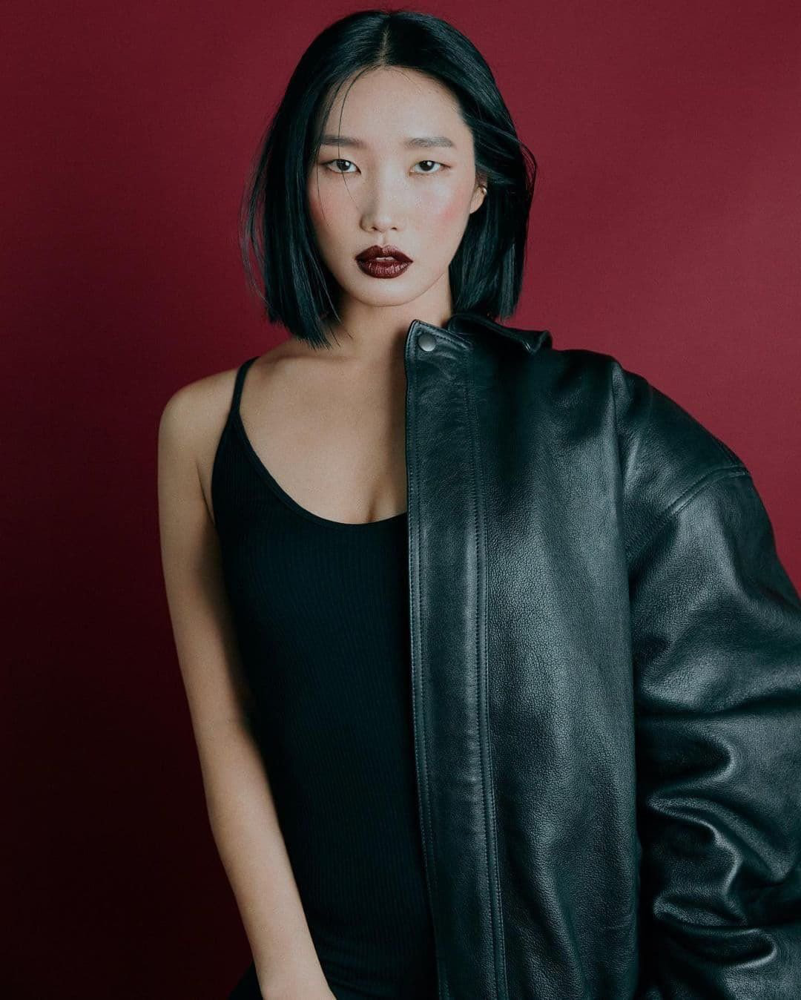

In [ ]:
import urllib.request
import time

# 다운받을 이미지 url
url = 'https://img.theqoo.net/img/DmwdC.jpg'

# 이미지 요청 및 다운로드
image_path = '/content/image3.jpg'
urllib.request.urlretrieve(url, image_path)

# 저장 된 이미지 확인
img = Image.open(image_path)
img

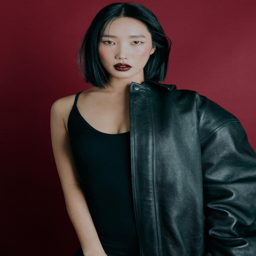

In [ ]:
# load the image
original_image = Image.open(image_path).convert("RGB")

# resize
original_image = original_image.resize((256, 256))

# print the original image
original_image

## Align Image

In [ ]:
# face detection
def run_alignment(image_path):
    import dlib
    from models.RestyleEncoder.align_faces_parallel import align_face
    if not os.path.exists("shape_predictor_68_face_landmarks.dat"):
        print('Downloading files for aligning face image...')
        os.system('wget http://dlib.net/files/shape_predictor_68_face_landmarks.dat.bz2')
        os.system('bzip2 -dk shape_predictor_68_face_landmarks.dat.bz2')
        print('Done.')
    predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
    aligned_image = align_face(filepath=image_path, predictor=predictor) 
    print("Aligned image has shape: {}".format(aligned_image.size))
    return aligned_image 

input_image = run_alignment(image_path)

Done.
Aligned image has shape: (256, 256)


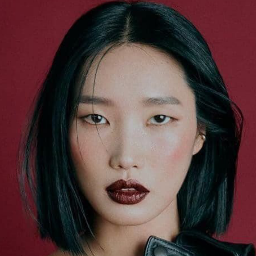

In [ ]:
# resized input image
input_image.resize((256, 256))

## Perform Inference

In [ ]:
img_transforms = EXPERIMENT_ARGS['transform']
transformed_image = img_transforms(input_image)

In [ ]:
#  generate the image corresponding to the average latent code ->  initialize the iterative refinement process.
def get_avg_image(net):
    avg_image = net(net.latent_avg.unsqueeze(0),
                    input_code=True,
                    randomize_noise=False,
                    return_latents=False,
                    average_code=True)[0]
    avg_image = avg_image.to('cuda').float().detach()
    if experiment_type == "cars_encode":
        avg_image = avg_image[:, 32:224, :]
    return avg_image

In [ ]:
opts.n_iters_per_batch = 5 #inference steps
opts.resize_outputs = False  # generate outputs at full resolution

In [ ]:
from models.RestyleEncoder.utils.inference_utils import run_on_batch

experiment_type = 'ffhq_encode'
with torch.no_grad():
    # get average latent code
    avg_image = get_avg_image(net)
    tic = time.time()
    # inference
    result_batch, result_latents = run_on_batch(transformed_image.unsqueeze(0).cuda(), net, opts, avg_image)
    toc = time.time()
    print('Inference took {:.4f} seconds.'.format(toc - tic))

Inference took 0.5982 seconds.


In [ ]:
# choose the last latents among 5 as encoded image
encoded_image = result_latents[0][-1]

In [ ]:
# reshape the encoded image
encoded_image = torch.Tensor(encoded_image.reshape(1, 18, 512))
print(encoded_image)

tensor([[[-16.6407,   2.0411, -22.5966,  ..., -15.5721,  -2.0875,  -8.8696],
         [-40.3141, -16.9684, -30.0168,  ...,  52.3565, -21.1625,   1.1500],
         [-18.3225,  -5.6495,   8.8297,  ..., -27.7271, -11.7199, -10.8982],
         ...,
         [ -3.3025,   2.9228,  -2.1726,  ...,  -5.5706,   6.8008,   2.3848],
         [  2.1969,  -0.2940,  -0.7738,  ...,   1.0251,   4.6433,   1.9620],
         [  1.3004,   0.2845,   0.4796,  ...,   0.4510,  -1.3675,  -1.3246]]])


In [ ]:
# save the latents
torch.save(encoded_image, './latents3.pt')

## Visualize Result

In [ ]:
resize_amount = (256, 256) if opts.resize_outputs else (opts.output_size, opts.output_size)

In [ ]:
def get_coupled_results(result_batch, transformed_image):
    """
    Visualize output images from left to right (the input image is on the right)
    """
    result_tensors = result_batch[0]  # there's one image in our batch
    result_images = [tensor2im(result_tensors[iter_idx]) for iter_idx in range(opts.n_iters_per_batch)]
    input_im = tensor2im(transformed_image)
    res = np.array(result_images[0].resize(resize_amount))
    for idx, result in enumerate(result_images[1:]):
        res = np.concatenate([res, np.array(result.resize(resize_amount))], axis=1)
    res = np.concatenate([res, input_im.resize(resize_amount)], axis=1)
    res = Image.fromarray(res)
    return res

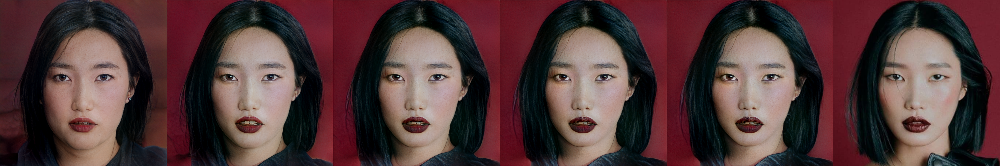

In [ ]:
# last image on the right => original image
res = get_coupled_results(result_batch, transformed_image)
res

# StyleCLIP_global direction

In [ ]:
# !git clone https://github.com/esoyeon/Multilingual-StyleCLIP.git

In [ ]:
# # set up
# %tensorflow_version 1.x
# ! pip install torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html 

# # clip install
# !pip install git+https://github.com/openai/CLIP.git 

# # multilingual set up 
# !pip install ftfy regex tqdm gdown
# !pip install transformers

# # Ninja set up
# !wget https://github.com/ninja-build/ninja/releases/download/v1.8.2/ninja-linux.zip
# !sudo unzip ninja-linux.zip -d /usr/local/bin/
# !sudo update-alternatives --install /usr/bin/ninja ninja /usr/local/bin/ninja 1 --force

In [ ]:
# %tensorflow_version 1.x
from argparse import Namespace
import time
import os
import sys
import numpy as np
from PIL import Image
import torch
import torchvision.transforms as transforms
import matplotlib.pyplot as plt


os.chdir('/content/Multilingual-StyleCLIP')

sys.path.append(".")
sys.path.append("..")

In [ ]:
# multilingual clil weights 
!bash get-weights.sh

--2021-12-03 15:40:03--  https://www.dropbox.com/s/s77xw5308jeljlp/Swedish-500k%20Linear%20Weights.pkl
Resolving www.dropbox.com (www.dropbox.com)... 162.125.2.18, 2620:100:601d:18::a27d:512
Connecting to www.dropbox.com (www.dropbox.com)|162.125.2.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/s77xw5308jeljlp/Swedish-500k%20Linear%20Weights.pkl [following]
--2021-12-03 15:40:03--  https://www.dropbox.com/s/raw/s77xw5308jeljlp/Swedish-500k%20Linear%20Weights.pkl
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc188856906bc35fe4e8befb0550.dl.dropboxusercontent.com/cd/0/inline/BbKlWqw1dMrQcpZpiEUZgruQss2HqngCrwtHuJlLTOnRZmViBEW8od_fSdPXVATvjTxfLzSxPJXqMstjoxyj4j7C4Y_fytnBQhj_IIVVTWwG7TEOhgBRjMF7TIQEQXjegVc8w_A5e-BsoNXDPqbTSjrb/file# [following]
--2021-12-03 15:40:04--  https://uc188856906bc35fe4e8befb0550.dl.dropboxusercontent.com/cd/0/inline/BbKlWqw1dMrQcpZpiEUZg

In [ ]:
os.chdir('/content/Multilingual-StyleCLIP/')
dataset_name='ffhq' 
# input dataset name 

# input prepare data 
!python models/global_directions/GetCode.py --dataset_name $dataset_name --code_type 'w' 
!python models/global_directions/GetCode.py --dataset_name $dataset_name --code_type 's' 
!python models/global_directions/GetCode.py --dataset_name $dataset_name --code_type 's_mean_std' 

--2021-12-03 15:40:33--  https://nvlabs-fi-cdn.nvidia.com/stylegan2/networks/stylegan2-ffhq-config-f.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 65.8.249.40, 65.8.249.88, 65.8.249.95, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)|65.8.249.40|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381673535 (364M) [application/x-www-form-urlencoded]
Saving to: ‘data/model/stylegan2-ffhq-config-f.pkl’

stylegan2-ffhq-conf 100%[===================>] 363.99M   113MB/s    in 3.8s    

2021-12-03 15:40:37 (96.5 MB/s) - ‘data/model/stylegan2-ffhq-config-f.pkl’ saved [381673535/381673535]

Setting up TensorFlow plugin "fused_bias_act.cu": Compiling... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Compiling... Loading... Done.
get all z and w
Generate S
2021-12-03 15:41:21.859141: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2021-12-03 15:41:21.

In [ ]:
imagenet_templates = [
'{}의 나쁜 사진입니다.',
# '많은 {}명의 사진'
'{}의 조각상',
'{} 보기 힘든 사진입니다.',
'{}의 저해상도 사진입니다.',
'{}의 렌더링입니다.',
'{}의 숫자입니다.',
'{}의 나쁜 사진입니다.',
'{}을(를) 자른 사진입니다.',
'{}의 문신입니다.',
'{}자수.',
'{} 보기 힘든 사진입니다.',
'{}의 밝은 사진입니다.',
'깨끗한 {}의 사진입니다.',
'더러운 {}의 사진',
'{}의 어두운 사진입니다.',
'{}을(를) 그립니다.',
'내 {}의 사진',
'플라스틱 {}',
'멋진 {}의 사진',
'{}의 클로즈업 사진입니다.',
'{}의 흑백 사진입니다.',
'{}을(를) 그린 그림입니다.',
'{}을(를) 그린 그림입니다.',
'{}의 픽셀화된 사진입니다.',
'{}의 조각상입니다.',
'{}의 밝은 사진입니다.',
'{}의 자른 사진입니다.',
'플라스틱 {}' ,
'더러운 {}의 사진입니다.',
'{}의 JPEG 손상 사진입니다.',
'{}의 흐릿한 사진입니다.',
'{}의 사진입니다.',
'{}의 좋은 사진입니다.',
'{}의 렌더링입니다.',
'비디오 게임에서 {}입니다.',
'한 {}의 사진입니다.',
'{}의 낙서입니다.',
'{}의 클로즈업 사진입니다.',
'{}의 사진입니다.',
'종이접기 {}',
'비디오 게임에서 {}',
'{}의 스케치.',
'{}의 낙서입니다.',
'종이접기 {}',
'{}의 저해상도 사진입니다.',
'장난감 {}' ,
'{}을(를) 변형한 것입니다.',
'청렴한 {}의 사진입니다.',
'큰 {}의 사진입니다.',
'{}을(를) 해석한 것입니다.',
'멋진 {}의 사진',
'이상한 {}의 사진',
'{}의 흐릿한 사진입니다.',
'만화 {}' ,
'{} 작품' ,
'{}의 스케치.',
'{}자수.',
'{}의 픽셀화된 사진입니다.',
'{}의 itap.',
'{}의 JPEG 손상 사진입니다.',
'{}의 좋은 사진',
'퍼시 {}' ,
'멋진 {}의 사진',
'작은 {}의 사진입니다.',
'이상한 {}의 사진',
'만화 {}' ,
'{}의 기술.',
'{}을(를) 그립니다.',
'큰 {}의 사진입니다.',
'{}의 흑백 사진입니다.',
'퍼시 {}' ,
'어두운 {} 사진입니다.',
'{}의 잇탭.',
'{}개 중 하나',
'장난감 {}' ,
'내 {}의 잇탭이다.',
'멋진 {} 사진',
'작은 {}의 사진입니다.',
'{}의 문신입니다.'
]

In [ ]:
imagenet_templates = [
    'a bad photo of a {}.',
#    'a photo of many {}.',
    'a sculpture of a {}.',
    'a photo of the hard to see {}.',
    'a low resolution photo of the {}.',
    'a rendering of a {}.',
    'graffiti of a {}.',
    'a bad photo of the {}.',
    'a cropped photo of the {}.',
    'a tattoo of a {}.',
    'the embroidered {}.',
    'a photo of a hard to see {}.',
    'a bright photo of a {}.',
    'a photo of a clean {}.',
    'a photo of a dirty {}.',
    'a dark photo of the {}.',
    'a drawing of a {}.',
    'a photo of my {}.',
    'the plastic {}.',
    'a photo of the cool {}.',
    'a close-up photo of a {}.',
    'a black and white photo of the {}.',
    'a painting of the {}.',
    'a painting of a {}.',
    'a pixelated photo of the {}.',
    'a sculpture of the {}.',
    'a bright photo of the {}.',
    'a cropped photo of a {}.',
    'a plastic {}.',
    'a photo of the dirty {}.',
    'a jpeg corrupted photo of a {}.',
    'a blurry photo of the {}.',
    'a photo of the {}.',
    'a good photo of the {}.',
    'a rendering of the {}.',
    'a {} in a video game.',
    'a photo of one {}.',
    'a doodle of a {}.',
    'a close-up photo of the {}.',
    'a photo of a {}.',
    'the origami {}.',
    'the {} in a video game.',
    'a sketch of a {}.',
    'a doodle of the {}.',
    'a origami {}.',
    'a low resolution photo of a {}.',
    'the toy {}.',
    'a rendition of the {}.',
    'a photo of the clean {}.',
    'a photo of a large {}.',
    'a rendition of a {}.',
    'a photo of a nice {}.',
    'a photo of a weird {}.',
    'a blurry photo of a {}.',
    'a cartoon {}.',
    'art of a {}.',
    'a sketch of the {}.',
    'a embroidered {}.',
    'a pixelated photo of a {}.',
    'itap of the {}.',
    'a jpeg corrupted photo of the {}.',
    'a good photo of a {}.',
    'a plushie {}.',
    'a photo of the nice {}.',
    'a photo of the small {}.',
    'a photo of the weird {}.',
    'the cartoon {}.',
    'art of the {}.',
    'a drawing of the {}.',
    'a photo of the large {}.',
    'a black and white photo of a {}.',
    'the plushie {}.',
    'a dark photo of a {}.',
    'itap of a {}.',
    'graffiti of the {}.',
    'a toy {}.',
    'itap of my {}.',
    'a photo of a cool {}.',
    'a photo of a small {}.',
    'a tattoo of the {}.',
]

In [ ]:
os.getcwd()

'/content/Multilingual-StyleCLIP'

In [ ]:
import os
os.chdir('/content/Multilingual-StyleCLIP/models/global_directions')

from manipulate import Manipulator
import clip

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device) 

M=Manipulator(dataset_name='ffhq', file_path = '/content/Multilingual-StyleCLIP/data/') 
fs3=np.load('/content/Multilingual-StyleCLIP/data/npy/ffhq/fs3.npy')
np.set_printoptions(suppress=True)

image_path = None
img_index = None

100%|███████████████████████████████████████| 338M/338M [00:03<00:00, 88.6MiB/s]


Setting up TensorFlow plugin "fused_bias_act.cu": Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Loading... Done.

Gs                              Params    OutputShape          WeightShape     
---                             ---       ---                  ---             
latents_in                      -         (?, 512)             -               
labels_in                       -         (?, 0)               -               
lod                             -         ()                   -               
dlatent_avg                     -         (512,)               -               
G_mapping/Normalize             -         (?, 512)             -               
G_mapping/Dense0                262656    (?, 512)             (512, 512)      
G_mapping/Dense1                262656    (?, 512)             (512, 512)      
G_mapping/Dense2                262656    (?, 512)             (512, 512)      
G_mapping/Dense3                262656    (?, 512)             (512, 




# Choose Image Index
Relevant only when editing generated image
 

In [ ]:
img_index =  1

# Choose Mode (and show input image)
Run for both real and generated image

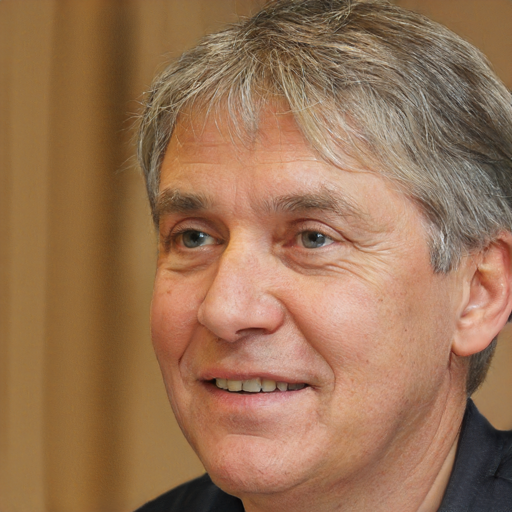

In [ ]:
mode='generated image' # ['real image', 'generated image']

# mode = 'real image'

if mode == 'real image':
  img_index = 0
#   latents=torch.load('/content/encoder4editing/latents.pt')
  latents = torch.load('/content/restyle-encoder/latents3.pt')
#   latents = torch.load('/content/drive/MyDrive/StyleClip/encoder4editing/latents.pt')
  w_plus=latents.cpu().detach().numpy()
  dlatents_loaded=M.W2S(w_plus)

  img_indexs=[img_index]
  dlatent_tmp=[tmp[img_indexs] for tmp in dlatents_loaded]
elif mode == 'generated image':
  img_indexs=[img_index]
  dlatent_tmp=[tmp[img_indexs] for tmp in M.dlatents]
M.num_images=len(img_indexs)

M.alpha=[0]
M.manipulate_layers=[0]
codes,out=M.EditOneC(0,dlatent_tmp) 
original=Image.fromarray(out[0,0]).resize((512,512))
M.manipulate_layers=None
original


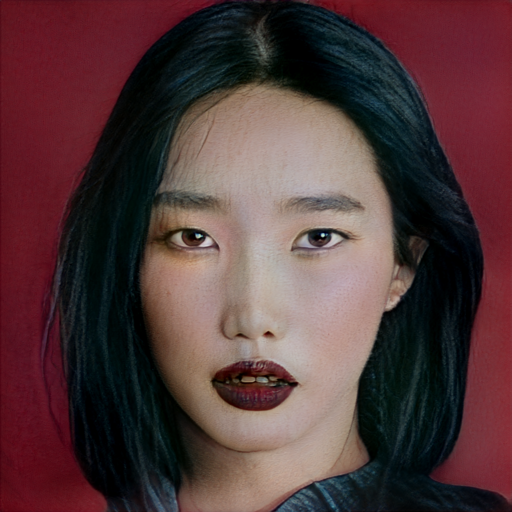

In [ ]:
# mode='generated image' # ['real image', 'generated image']

mode = 'real image'

if mode == 'real image':
  img_index = 0
  latents=torch.load('/content/Multilingual-StyleCLIP/latents3.pt')
  w_plus=latents.cpu().detach().numpy()
  dlatents_loaded=M.W2S(w_plus)

  img_indexs=[img_index]
  dlatent_tmp=[tmp[img_indexs] for tmp in dlatents_loaded]
elif mode == 'generated image':
  img_indexs=[img_index]
  dlatent_tmp=[tmp[img_indexs] for tmp in M.dlatents]
M.num_images=len(img_indexs)

M.alpha=[0]
M.manipulate_layers=[0]
codes,out=M.EditOneC(0,dlatent_tmp) 
original=Image.fromarray(out[0,0]).resize((512,512))
M.manipulate_layers=None
original


# input text description 
For example

| Edit  | Neutral Text | Target Text |
| --- | --- | --- |
| Smile  | face  | smiling face |
| Gender  | female face  | male face |
| Blonde hair | face with hair | face with blonde hair |
| Hi-top fade | face with hair | face with Hi-top fade hair |
| Blue eyes | face with eyes | face with blue eyes |


In [ ]:
os.chdir('/content/Multilingual-StyleCLIP/')

from models.global_directions.MapTS import GetFs,GetBoundary,GetDt

neutral='눈을 가진 얼굴' # {type:"string"}
target='파란 눈을 가진 얼굴' # {type:"string"}
classnames=[target,neutral]
dt=GetDt(classnames, model, imagenet_templates)

Downloading:   0%|          | 0.00/297 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/804 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/972k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/679M [00:00<?, ?B/s]

0.3337599


In [ ]:
neutral='여성 얼굴' # {type:"string"}
target='남성 얼굴' # {type:"string"}
classnames=[target,neutral]
dt=GetDt(classnames,model, imagenet_templates)

0.3165727


# modify manipulation strength (alhpa) and disentangle threshold (beta)

- *Manipulation strength* - positive values correspond to moving along the target direction.
- *Disentanglement threshold* - large value means more disentangled edit, just a few channels will be manipulated so only the target attribute will change (for example, grey hair). Small value means less disentangled edit, a large number of channels will be manipulated, related attributes will also change (such as wrinkle, skin color, glasses).

- In the terminal, for every manipulation, the number of channels being manipulated is printed (the number is controlled by the attribute (neutral, target) and the disentanglement threshold).

- For color transformation, usually 10-20 channels is enough. For large structure change (for example, Hi-top fade), usually 100-200 channels are required.
- For an attribute (neutral, target), if you give a low disentanglement threshold, there are just few channels (<20) being manipulated, and usually it is not enough for performing the desired edit.

num of channels being manipulated: 22


(-0.5, 1023.5, 1023.5, -0.5)

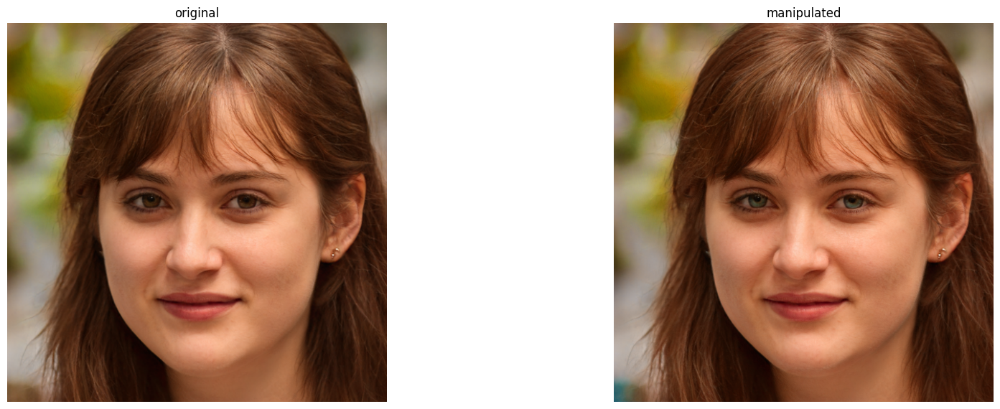

In [ ]:
#beta=0.1
#alpha=1
beta = 0.1 # {type:"slider", min:0.08, max:0.3, step:0.01}
alpha = 5 # {type:"slider", min:-10, max:10, step:0.1}
M.alpha=[alpha]
boundary_tmp2,c=GetBoundary(fs3,dt,M,threshold=beta)
codes=M.MSCode(dlatent_tmp,boundary_tmp2)
out=M.GenerateImg(codes)
generated=Image.fromarray(out[0,0])#.resize((512,512))


plt.figure(figsize=(20,7), dpi= 100)
plt.subplot(1,2,1)
plt.imshow(original)
plt.title('original')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(generated)
plt.title('manipulated')
plt.axis('off')

num of channels being manipulated: 1244


(-0.5, 1023.5, 1023.5, -0.5)

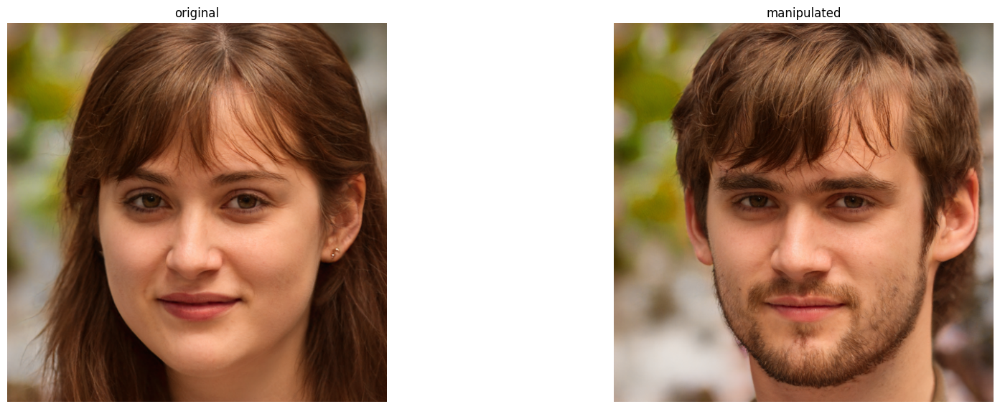

In [ ]:
#beta=0.1
#alpha=1
beta = 0.1 # {type:"slider", min:0.08, max:0.3, step:0.01}
alpha = 1.5 # {type:"slider", min:-10, max:10, step:0.1}
M.alpha=[alpha]
boundary_tmp2,c=GetBoundary(fs3,dt,M,threshold=beta)
codes=M.MSCode(dlatent_tmp,boundary_tmp2)
out=M.GenerateImg(codes)
generated=Image.fromarray(out[0,0])#.resize((512,512))


plt.figure(figsize=(20,7), dpi= 100)
plt.subplot(1,2,1)
plt.imshow(original)
plt.title('original')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(generated)
plt.title('manipulated')
plt.axis('off')

num of channels being manipulated: 22


(-0.5, 1023.5, 1023.5, -0.5)

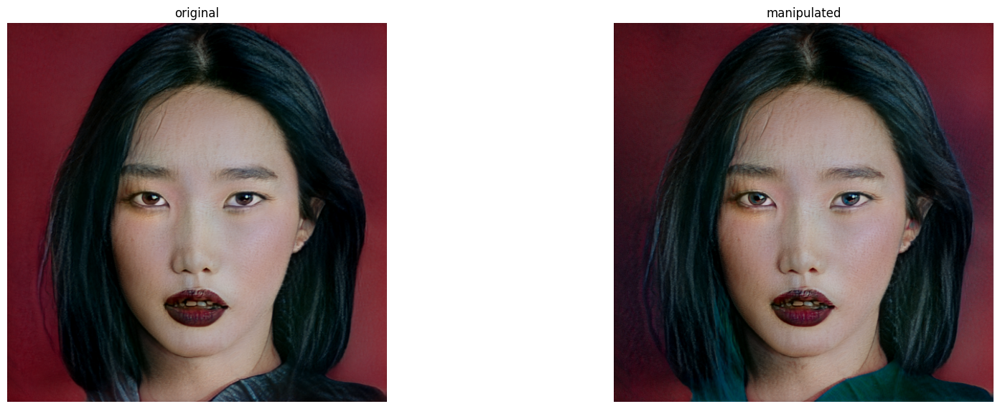

In [ ]:
#beta=0.1
#alpha=1
beta = 0.1 # {type:"slider", min:0.08, max:0.3, step:0.01}
alpha = 10 # {type:"slider", min:-10, max:10, step:0.1}
M.alpha=[alpha]
boundary_tmp2,c=GetBoundary(fs3,dt,M,threshold=beta)
codes=M.MSCode(dlatent_tmp,boundary_tmp2)
out=M.GenerateImg(codes)
generated=Image.fromarray(out[0,0])#.resize((512,512))


plt.figure(figsize=(20,7), dpi= 100)
plt.subplot(1,2,1)
plt.imshow(original)
plt.title('original')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(generated)
plt.title('manipulated')
plt.axis('off')

num of channels being manipulated: 1244


(-0.5, 1023.5, 1023.5, -0.5)

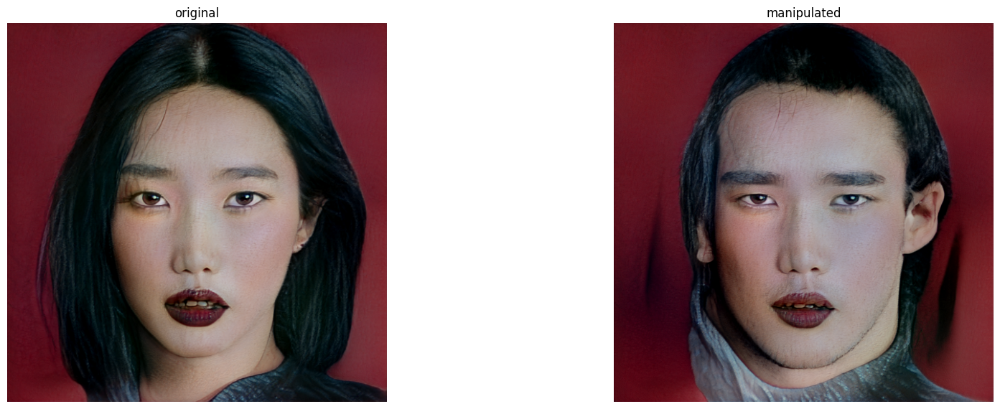

In [ ]:
#beta=0.1
#alpha=1
beta = 0.1 # {type:"slider", min:0.08, max:0.3, step:0.01}
alpha = 5 # {type:"slider", min:-10, max:10, step:0.1}
M.alpha=[alpha]
boundary_tmp2,c=GetBoundary(fs3,dt,M,threshold=beta)
codes=M.MSCode(dlatent_tmp,boundary_tmp2)
out=M.GenerateImg(codes)
generated=Image.fromarray(out[0,0])#.resize((512,512))


plt.figure(figsize=(20,7), dpi= 100)
plt.subplot(1,2,1)
plt.imshow(original)
plt.title('original')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(generated)
plt.title('manipulated')
plt.axis('off')